## Pre-processing ##
Now that everything is set up, we want to load our data, but first we need to load a couple of useful python packages:


In [562]:
from sys import stdout

import random
import numpy as np

import matplotlib.pyplot as plt

from PIL import Image
import math
import keras
import keras.backend as K
import segmentation_models as sm
import cv2
import copy

In [563]:
from segments import SegmentsClient, SegmentsDataset
from segments.utils import export_dataset
from segments.utils import get_semantic_bitmap

# load and plot dataset from segments.ai

In [564]:
client = SegmentsClient('3d2505cf0a95d64eabb333d76ecb472bcca6a456')
dataset_name_n = 'ayda/faullt_8'
dataset_name_1 = 'ayda/faul_1_new'
dataset_name_2 = 'ayda/fault_2'
dataset_name_3 = 'ayda/fault_3'
dataset_name_4 = 'ayda/fault_4'
dataset_name_5 = 'ayda/fault_5'
dataset_name_7 = 'ayda/fault_7'


# Get a list of image URLs
release_n = client.get_release(dataset_name_n, 'fault_13.a') 
release_1 = client.get_release(dataset_name_1, 'fault_1') 
release_2 = client.get_release(dataset_name_2, 'fault_2') 
release_3 = client.get_release(dataset_name_3, 'fault_3')
release_4 = client.get_release(dataset_name_4, 'fault_4')
release_5 = client.get_release(dataset_name_5, 'fault_5')
release_7 = client.get_release(dataset_name_7, 'fault_7')

## loading data and lable then show together

Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 94.00it/s]

Initialized dataset with 9 images.


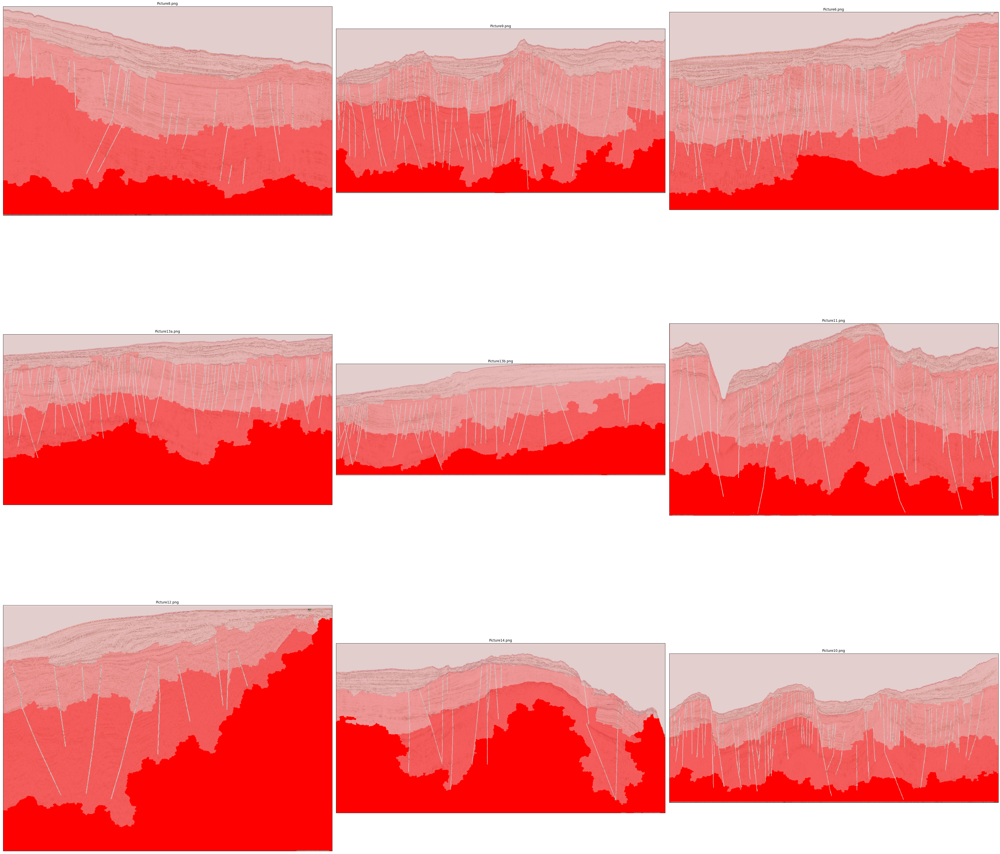

In [565]:
# from google.colab import widgets

def load_data_label(sample):

    label = get_semantic_bitmap(sample['segmentation_bitmap'], sample['annotations'])
    data = np.asarray(sample['image']) / 255.
    #converting to grayscale
#         data = 0.2989*data[:,:,0] + 0.5870*data[:,:,1] + 0.1140*data[:,:,2]
#         data = Image.open(data_dir + sample['file_name'])
    label = np.asarray(label)
    return data, label


def plot_overlay(image, label, i):
    (tmax, xmax) = np.shape(label)

    label_rgb = np.zeros((tmax,xmax,4), 'uint8')
    label_rgb[:,:,0] = 255
    label_rgb[:,:,1] = 255 - 255*label/np.max(label)
    label_rgb[:,:,2] = 255 - 255*label/np.max(label)
    label_rgb[:,:,3] = 255*label/np.max(label)   
    
    img = Image.fromarray(label_rgb, mode='RGBA')
    
#     img_gray = 0.2989*image[:,:,0] + 0.5870*image[:,:,1] + 0.1140*image[:,:,2]
    image_rgb = np.zeros((tmax,xmax,4), 'uint8')    
    image_rgb[:,:,0] = 255*image[:,:,0]
    image_rgb[:,:,1] = 255*image[:,:,1]
    image_rgb[:,:,2] = 255*image[:,:,2]
#     image_rgb[:,:,0:3] = 255. * image
    image_rgb[:,:,3] = 255
    
    background = Image.fromarray(image_rgb, mode='RGBA') 
    background.paste(img, (0, 0), img)

#     background = Image.fromarray(image_rgb, mode='RGBA') 
#     print(image.shape)
#     print(label.shape)
#     background.paste(label, (0, 0), label)

    plt.subplot(3,3,i+1).imshow(background)
    plt.title(sample['file_name'])
    plt.xticks([])
    plt.yticks([])



release = [release_n]
plt.figure(figsize=(50,50))
dataset = SegmentsDataset(release_n)
for i, sample in enumerate(dataset): 
    data, label = load_data_label(sample)
    
    plot_overlay(data, label, i)
#     plt.subplot(1,3,i+1).xticks([])
#     plt.yticks([])

In [566]:
def load_data_label(release):
    dataset = SegmentsDataset(release)
    for sample in dataset:
        label = get_semantic_bitmap(sample['segmentation_bitmap'], sample['annotations'])
        label = np.stack([label==v for v in np.unique(label)], axis=-1)
        data = np.asarray(sample['image']) / 255.
        #converting to grayscale
#         data = 0.2989*data[:,:,0] + 0.5870*data[:,:,1] + 0.1140*data[:,:,2]
#         data = Image.open(data_dir + sample['file_name'])
    label = np.asarray(label)
    return data, label


def patchify(data, label, size, number, seg):

    (t_max, x_max, _) = label.shape    
        
    n = 0
    X = np.zeros((number,size,size,3))
    Y = np.zeros((number,size,size,1))
    
    for t in range(size//2+1, t_max-size//2, 10):
        for x in range(size//2+1, x_max-size//2, 10):
            if n<number and label[t,x,seg]:
                X[n, ...] = data[t-size//2:t+size//2, x-size//2:x+size//2, :]
                Y[n, :,:,0] = label[t-size//2:t+size//2, x-size//2:x+size//2, 1]
                n = n + 1
            
    return X, Y


# Parameters
size       = 64
s          = size//2
threshold  = 0
stride     = 10
num_val    = 2000
np.random.seed(100)

# Validation data from inline 300
X_val = np.zeros((num_val,size,size,3))
Y_val = np.zeros((num_val,size,size,1))

seg = [3,4]

n = 0
release_list = [release_1]
for i, release in enumerate(release_list):
    seismic, label = load_data_label(release)
    Num = np.sum(label[s:-s:stride,s:-s:stride, seg[i]])
    X_val[n:n+num_val,...], Y_val[n:n+num_val,...] = patchify(seismic[:,:,:3], label, size, num_val, seg[i]) 
    n += num_val

# Training data from inlines 

release_list = [release_2, release_3, release_4, release_5, release_7, release_n]
seg = [3,4]

n = 0
num_train = []
for i, release in enumerate(release_list):
    seismic, label = load_data_label(release)
    Num += int(np.sum(label[s:-s:stride,s:-s:stride,seg[0]])//stride) + int(np.sum(label[s:-s:stride,s:-s:stride,seg[1]])//stride)
    num_train.append(Num)

X_train = np.zeros((Num,size,size,3))
Y_train = np.zeros((Num,size,size,1))

for s_i in seg:
    for i, release in enumerate(release_list):
        seismic, label = load_data_label(release)
        X_train[n:n+num_train[i],...], Y_train[n:n+num_train[i],...] = patchify(seismic[:,:,:3], label, size, num_train[i], s_i) 

def load_data_label(sample):

    label = get_semantic_bitmap(sample['segmentation_bitmap'], sample['annotations'])
    label = np.stack([label==v for v in np.unique(label)], axis=-1)
    data = np.asarray(sample['image']) / 255.

    return data, label

dataset = SegmentsDataset(release_n)

for s_i in seg:
    for sample in dataset:
        seismic, label = load_data_label(sample)
        Num = np.sum(label[s:-s:stride,s:-s:stride,s_i])
        X_temp, Y_temp = patchify(seismic[:,:,:3], label, size, Num, s_i) 
        X_train = np.concatenate((X_train, X_temp), axis=0)
        Y_train = np.concatenate((Y_train, Y_temp), axis=0)

Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 32.24it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 33.23it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17.59it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 38.57it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 27.50it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 29.62it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 130.60it/s]

Initialized dataset with 9 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 38.57it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26.39it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 41.80it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 26.38it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 40.18it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 163.98it/s]

Initialized dataset with 9 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 45.62it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 33.20it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 55.60it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 34.58it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 38.31it/s]

Initialized dataset with 1 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 140.93it/s]

Initialized dataset with 9 images.


Initializing dataset...
Preloading all samples. This may take a while...


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 123.63it/s]

Initialized dataset with 9 images.


Before training, it's always a good idea to check the training data, so let's do that:

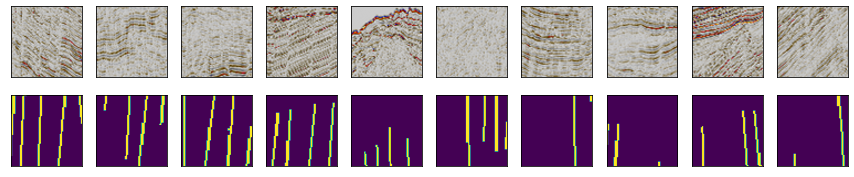

In [6]:
fig, axs = plt.subplots(2, 10, figsize=(15,3))

K = []
for m in range(10):
    k = random.randint(0,2000)
    K.append(k)
    axs[0,m].imshow(X_train[k], interpolation='spline16', cmap=plt.cm.gray, aspect=1)
    axs[0,m].set_xticks([])
    axs[0,m].set_yticks([])

# K = np.stack(K)
for m in range(10):
    axs[1,m].imshow(Y_train[K[m]], interpolation='spline16', aspect=1)
    axs[1,m].set_xticks([])
    axs[1,m].set_yticks([])
    k += 1


## Training ##
To train our model, we need to define its architecture. 



In [641]:
 sm.Unet?

<function segmentation_models.models.unet.Unet(backbone_name='vgg16', input_shape=(None, None, 3), classes=1, activation='sigmoid', weights=None, encoder_weights='imagenet', encoder_freeze=False, encoder_features='default', decoder_block_type='upsampling', decoder_filters=(256, 128, 64, 32, 16), decoder_use_batchnorm=True, **kwargs)>

In [644]:
dice_loss = sm.losses.DiceLoss()
metrics= [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]
size = 64
# model = UNet()
model = sm.Unet('mobilenet', classes=1, activation='sigmoid', decoder_filters=(64, 32, 32, 16, 4), input_shape=(64, 64, 3))
model.compile(optimizer="Adam", loss=dice_loss, metrics=metrics)

model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 65, 65, 3)    0           ['input_4[0][0]']                
                                                                                                  
 conv1 (Conv2D)                 (None, 32, 32, 32)   864         ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 32, 32, 32)   128         ['conv1[0][0]']                  
                                                                                            

 on)                                                                                              
                                                                                                  
 conv_pw_5_relu (ReLU)          (None, 8, 8, 256)    0           ['conv_pw_5_bn[0][0]']           
                                                                                                  
 conv_pad_6 (ZeroPadding2D)     (None, 9, 9, 256)    0           ['conv_pw_5_relu[0][0]']         
                                                                                                  
 conv_dw_6 (DepthwiseConv2D)    (None, 4, 4, 256)    2304        ['conv_pad_6[0][0]']             
                                                                                                  
 conv_dw_6_bn (BatchNormalizati  (None, 4, 4, 256)   1024        ['conv_dw_6[0][0]']              
 on)                                                                                              
          

 conv_pw_11 (Conv2D)            (None, 4, 4, 512)    262144      ['conv_dw_11_relu[0][0]']        
                                                                                                  
 conv_pw_11_bn (BatchNormalizat  (None, 4, 4, 512)   2048        ['conv_pw_11[0][0]']             
 ion)                                                                                             
                                                                                                  
 conv_pw_11_relu (ReLU)         (None, 4, 4, 512)    0           ['conv_pw_11_bn[0][0]']          
                                                                                                  
 conv_pad_12 (ZeroPadding2D)    (None, 5, 5, 512)    0           ['conv_pw_11_relu[0][0]']        
                                                                                                  
 conv_dw_12 (DepthwiseConv2D)   (None, 2, 2, 512)    4608        ['conv_pad_12[0][0]']            
          

 decoder_stage2_upsampling (UpS  (None, 16, 16, 32)  0           ['decoder_stage1b_relu[0][0]']   
 ampling2D)                                                                                       
                                                                                                  
 decoder_stage2_concat (Concate  (None, 16, 16, 160)  0          ['decoder_stage2_upsampling[0][0]
 nate)                                                           ',                               
                                                                  'conv_pw_3_relu[0][0]']         
                                                                                                  
 decoder_stage2a_conv (Conv2D)  (None, 16, 16, 32)   46080       ['decoder_stage2_concat[0][0]']  
                                                                                                  
 decoder_stage2a_bn (BatchNorma  (None, 16, 16, 32)  128         ['decoder_stage2a_conv[0][0]']   
 lization)

To visualize our training, you can plot learning curves:

In [643]:
model.save('ckpt.h5')

In [568]:
model.load_weights('checkpoint_tot3_14_Dec_clu_dice')

counted number of fault in each patch , how large are the structer ,
how we are going to measure to look at top to the bottom,
if we change the patch size how this things wille change

In [569]:
def tile_segment(data, label, wsize, dt, dx, seg):
    
    (t_max, x_max, _) = data.shape    
    
    n_patch = (t_max//dt+1)*(x_max//dx+1)
    data_patch = np.zeros((n_patch,wsize,wsize,3)) 

    n = 0
    T = []
    N = []
    for t in range(0, t_max, dt):
        for x in range(0, x_max, dx):  
            if label[t,x,seg[0]] or label[t,x,seg[1]] or label[t,x,seg[2]]:
                T.append([t,x])

                if t_max - t < wsize and x_max - x < wsize:
                    data_patch[n,:,:,:] = data[t_max-wsize:t_max, x_max-wsize:x_max,:3]
                elif x_max - x < wsize:
                    data_patch[n,:,:,:] = data[t:t+wsize, x_max-wsize:x_max,:3]
                elif t_max - t < wsize:
                    data_patch[n,:,:,:] = data[t_max-wsize:t_max, x:x+wsize,:3]
                else:
                    data_patch[n,:,:,:] = data[t:t+wsize,x:x+wsize, :3]  
                N.append(n)
            n = n + 1
    return data_patch, T, N

def tile_no_segment(data, wsize, dt, dx):
    
    (t_max, x_max, _) = data.shape    
    
    n_patch = (t_max//dt+1)*(x_max//dx+1)
    data_patch = np.zeros((n_patch,wsize,wsize,3)) 

    n = 0

    for t in range(0, t_max, dt):
        for x in range(0, x_max, dx):  
                if t_max - t < wsize and x_max - x < wsize:
                    data_patch[n,:,:,:] = data[t_max-wsize:t_max, x_max-wsize:x_max,:3]
                elif x_max - x < wsize:
                    data_patch[n,:,:,:] = data[t:t+wsize, x_max-wsize:x_max,:3]
                elif t_max - t < wsize:
                    data_patch[n,:,:,:] = data[t_max-wsize:t_max, x:x+wsize,:3]
                else:
                    data_patch[n,:,:,:] = data[t:t+wsize,x:x+wsize, :3]  
                n = n + 1

    return data_patch

In [570]:
def merge_segment(data_patch, t_max, x_max, wsize, dt, dx, T, N):

    data_new = np.zeros((t_max, x_max,3))
    count = np.zeros((t_max, x_max, 1))
    
    n = 0
    for t,x in T:

            if t_max - t < wsize and x_max - x < wsize:
                data_new[t_max-wsize:t_max, x_max-wsize:x_max,:] += data_patch[N[n],:,:,:]
                count[t_max-wsize:t_max, x_max-wsize:x_max,0] += 1
            elif x_max - x < wsize:
                data_new[t:t+wsize, x_max-wsize:x_max,:] += data_patch[N[n],:,:,:]
                count[t:t+wsize, x_max-wsize:x_max,0] += 1 
            elif t_max - t < wsize:
                data_new[t_max-wsize:t_max, x:x+wsize,:] += data_patch[N[n],:,:,:]
                count[t_max-wsize:t_max, x:x+wsize,0] += 1
            else:
                data_new[t:t+wsize,x:x+wsize,:] += data_patch[N[n],:,:,:]
                count[t:t+wsize,x:x+wsize,0] += 1 
            
            n = n + 1

    return data_new

def merge_no_segment(data_patch, t_max, x_max, wsize, dt, dx):

    data_new = np.zeros((t_max, x_max,3))
    count = np.zeros((t_max, x_max, 1))
    
    n = 0
    for t in range(0, t_max, dt):
        for x in range(0, x_max, dx):
            if t_max - t < wsize and x_max - x < wsize:
                data_new[t_max-wsize:t_max, x_max-wsize:x_max,:] += data_patch[n, :,:,:]
                count[t_max-wsize:t_max, x_max-wsize:x_max,0] += 1
            elif x_max - x < wsize:
                data_new[t:t+wsize, x_max-wsize:x_max,:] += data_patch[n,:,:,:]
                count[t:t+wsize, x_max-wsize:x_max,0] += 1 
            elif t_max - t < wsize:
                data_new[t_max-wsize:t_max, x:x+wsize,:] += data_patch[n,:,:,:]
                count[t_max-wsize:t_max, x:x+wsize,0] += 1
            else:
                data_new[t:t+wsize,x:x+wsize,:] += data_patch[n,:,:,:]
                count[t:t+wsize,x:x+wsize,0] += 1 

            n = n + 1

    return data_new/count


In [571]:
def plot_overlay(image, label, i):
    (tmax, xmax) = np.shape(label)

    label_rgb = np.zeros((tmax,xmax,4), 'uint8')
    label_rgb[:,:,0] = 255
    label_rgb[:,:,1] = 255 - 255*label/np.max(label)
    label_rgb[:,:,2] = 255 - 255*label/np.max(label)
    label_rgb[:,:,3] = 255*label /np.max(label)  
    
    img = Image.fromarray(label_rgb, mode='RGBA')
    
    image_rgb = np.zeros((tmax,xmax,4), 'uint8')    
    image_rgb[:,:,0] = 255*image[:,:,0]
    image_rgb[:,:,1] = 255*image[:,:,1]
    image_rgb[:,:,2] = 255*image[:,:,2]
#     image_rgb[:,:,0:3] = 255. * image
    image_rgb[:,:,3] = 255
    
    background = Image.fromarray(image_rgb, mode='RGBA') 
    background.paste(img, (0, 0), img)

#     background = Image.fromarray(image_rgb, mode='RGBA') 
#     print(image.shape)
#     print(label.shape)
#     background.paste(label, (0, 0), label)

    plt.subplot(9,1,i+1).imshow(background)
    plt.xticks([])
    plt.yticks([])

In [572]:
def load_data_label_no_segment(sample):
    
    label = get_semantic_bitmap(sample['segmentation_bitmap'], sample['annotations'])
    data = np.asarray(sample['image']) / 255.
    label = np.asarray(label)
    return data, label

def load_data_label_segment(sample):
    
    
    label = get_semantic_bitmap(sample['segmentation_bitmap'], sample['annotations'])
    label = np.stack([label==v for v in np.unique(label)], axis=-1)
    data = np.asarray(sample['image']) / 255.
    label = np.asarray(label)
    return data, label

Initializing dataset...
Preloading all samples. This may take a while...


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 147.93it/s]

Initialized dataset with 9 images.


([], [])

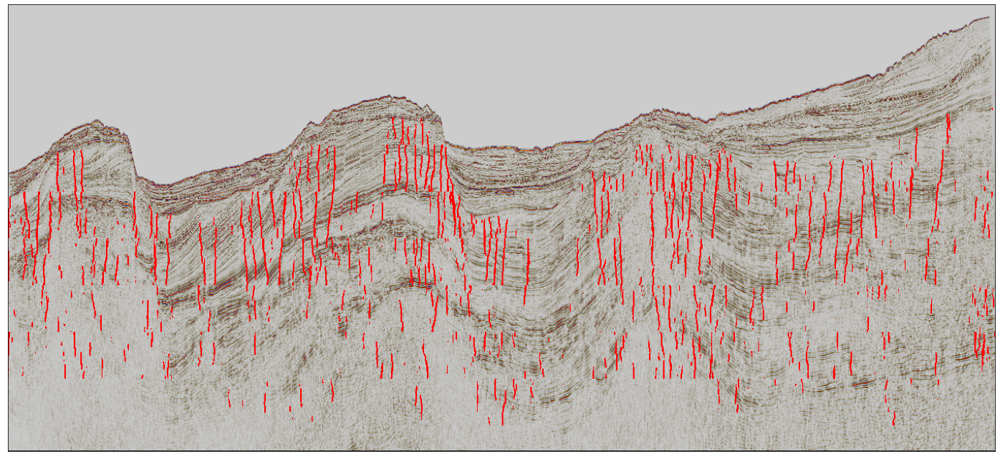

In [573]:
dt = 64
dx = 64

plt.figure(figsize=(100,80))
seg = [3,4,5]
    
dataset = SegmentsDataset(release_n)     
data, label = load_data_label_segment(dataset[8])
(t_max, x_max, _) = data.shape

data_tiles, T, N   = tile_segment(data, label, size, dt, dx, seg)
result_tiles = 1.*(model.predict_on_batch(data_tiles)>0.5)
result       = 1.*(merge_segment(result_tiles, t_max, x_max, size, dt, dx, T, N)>0.75)
plot_overlay(data, result[:,:,0],i)
plt.xticks([])
plt.yticks([])

## How many of pixels have lable fault

Initializing dataset...
Preloading all samples. This may take a while...


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 38.57it/s]

Initialized dataset with 1 images.


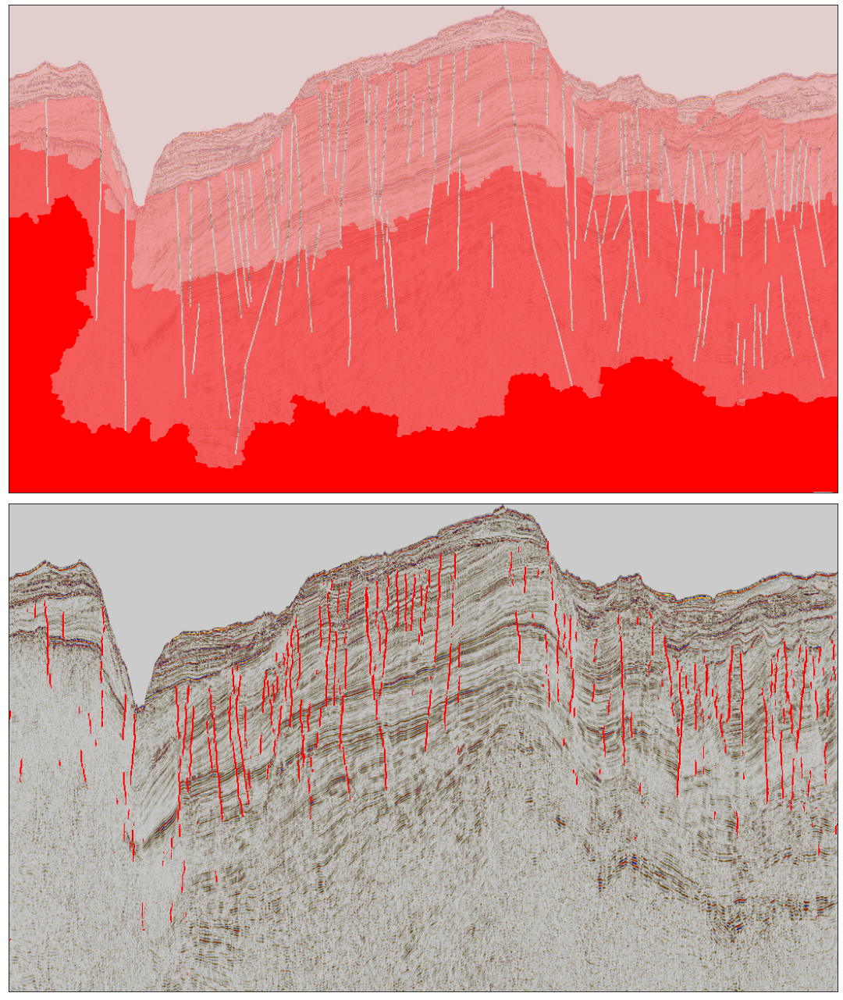

In [574]:
dt = 8
dx = 8

plt.figure(figsize=(100,80))
    
sample = SegmentsDataset(release_1)     
data, label = load_data_label_no_segment(sample[0])
plot_overlay(data, label, 0)

(t_max, x_max, _) = data.shape

data_tiles = tile_no_segment(data, size, dt, dx)
result_tiles = 1.*(model.predict_on_batch(data_tiles)>0.5)
result       = 1.*(merge_no_segment(result_tiles, t_max, x_max, size, dt, dx)>0.5)
plot_overlay(data, result[:,:,0], 1)


### in each patch howmany pixels have lable 1

In [575]:
def line_detect(patch):    
   
    flag = 0
    X = []
    for i in range(patch.shape[0]):
        for j in range(patch.shape[1]):
            if patch[i,j] and not flag:
                flag = 1
                X.append([i, j])
            if patch[i,j:j+1]:
                flag = 0

    x_left = []
    x_right = []

    for x in X:
        if x[1]<4:
            x_left.append(x)
        else:
            x_right.append(x)
    return x_right, x_left


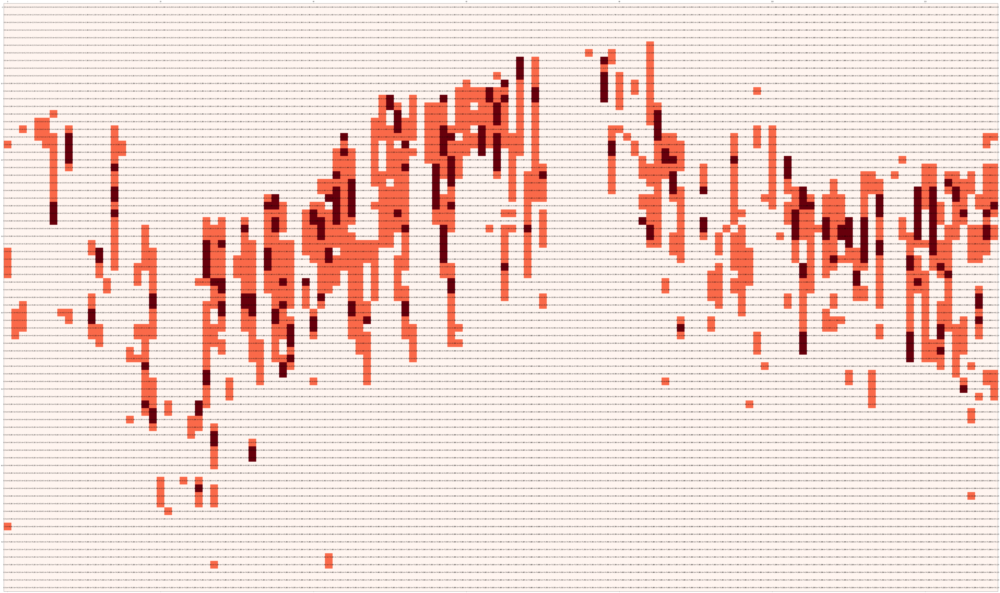

In [576]:
def tile(data, wsize, dt, dx):
    
    (t_max, x_max, _) = data.shape    
    
    n_patch = (t_max//dt+1)*(x_max//dx+1)
    data_patch = np.zeros(((t_max//dt+1), (x_max//dx+1),dt,dx,3)) 

    n_t = 0
    
    N = []
    
    for n_t, t in enumerate(range(0, t_max, dt)): 
        
        for n_x, x in enumerate(range(0, x_max, dx)):

            N.append([t,x])
            if t_max - t < dt and x_max - x < dx:
                data_patch[n_t,n_x,:,:,:] = data[t_max-dt:t_max, x_max-dx:x_max,:3]
            elif t_max - t < dt:
                data_patch[n_t,n_x,:,:,:] = data[t_max-dt:t_max, x:x+dx,:3]
            elif x_max - x < dx:
                data_patch[n_t,n_x,:,:,:] = data[t:t+dt, x_max-dx:x_max,:3]
            else:
                data_patch[n_t,n_x,:,:,:] = data[t:t+dt,x:x+dx, :3]  

    return data_patch, N

data_tiles, N = tile(result, size, dt, dx)

def slope(x1, y1, x2, y2): # Line slope given two points:
    return (y2-y1)/(x2-x1)

def angle(s1, s2): 
    return math.degrees(math.atan((s2-s1)/(1+(s2*s1))))
    
def counter_line(data_tiles):
    
    counter = np.zeros((data_tiles.shape[0], data_tiles.shape[1]))
    result_tiles_interp = np.zeros((data_tiles.shape[0],data_tiles.shape[1],data_tiles.shape[2],data_tiles.shape[3]))

    for i in range(data_tiles.shape[0]):
        for j in range(data_tiles.shape[1]):
            res_tile = data_tiles[i,j, ...]

            x_right, x_left = line_detect(res_tile)
            res_right = np.zeros((8,8))
            res_left = np.zeros((8,8))
            if x_right:
                
                x1, x2 = 0, 7
                y1, y2 = x_right[0][1], x_right[-1][1]
                res_right = cv2.line(np.uint8(res_tile*255), (y1,x1), (y2,x2), (255), 1)
                counter[i,j] += 1
            if x_left:
                
                x1, x2 = 0, 7
                y1, y2 = x_left[0][1], x_left[-1][1]
                res_left = cv2.line(np.uint8(res_tile*255), (y1,x1), (y2,x2), (255), 1)
                counter[i,j] += 1
                
            result_tiles_interp[i,j,...] = np.add(res_left, res_right)
    return counter, result_tiles_interp

num_lines_in_patch, result_interp = counter_line(np.sum(data_tiles, axis=-1)/3) 

min_val, max_val = np.min(num_lines_in_patch), np.max(num_lines_in_patch)

plt.rcParams["figure.autolayout"] = True

fig, ax = plt.subplots(figsize=(100,100))
img = ax.imshow(result)

ax.matshow(num_lines_in_patch, cmap=plt.cm.Reds)

for i in range(num_lines_in_patch.shape[0]):
    for j in range(num_lines_in_patch.shape[1]):
        c=str(num_lines_in_patch[i,j]) + f' id={i},{j}'
        ax.text(j, i, c, va='center', ha='center')
plt.show()      

In [577]:
def merge_no_segment(data_patch, t_max, x_max, wsize, dt, dx):

    data_new = np.zeros((t_max, x_max))
    count = np.zeros((t_max, x_max))
    
    n = 0
    for t in range(0, t_max, dt):
        for x in range(0, x_max, dx):
            if t_max - t < dt and x_max - x < dx:
                data_new[t_max-dt:t_max, x_max-dx:x_max] += data_patch[n, :,:]
                count[t_max-dt:t_max, x_max-dx:x_max] += 1
            elif x_max - x < dx:
                data_new[t:t+dt, x_max-dx:x_max] += data_patch[n,:,:]
                count[t:t+wsize, x_max-dx:x_max] += 1 
            elif t_max - t < dt:
                data_new[t_max-dt:t_max, x:x+dx] += data_patch[n,:,:]
                count[t_max-dt:t_max, x:x+dx] += 1
            else:
                data_new[t:t+dt,x:x+dx] += data_patch[n,:,:]
                count[t:t+dt,x:x+dx] += 1 

            n = n + 1
    return data_new/255

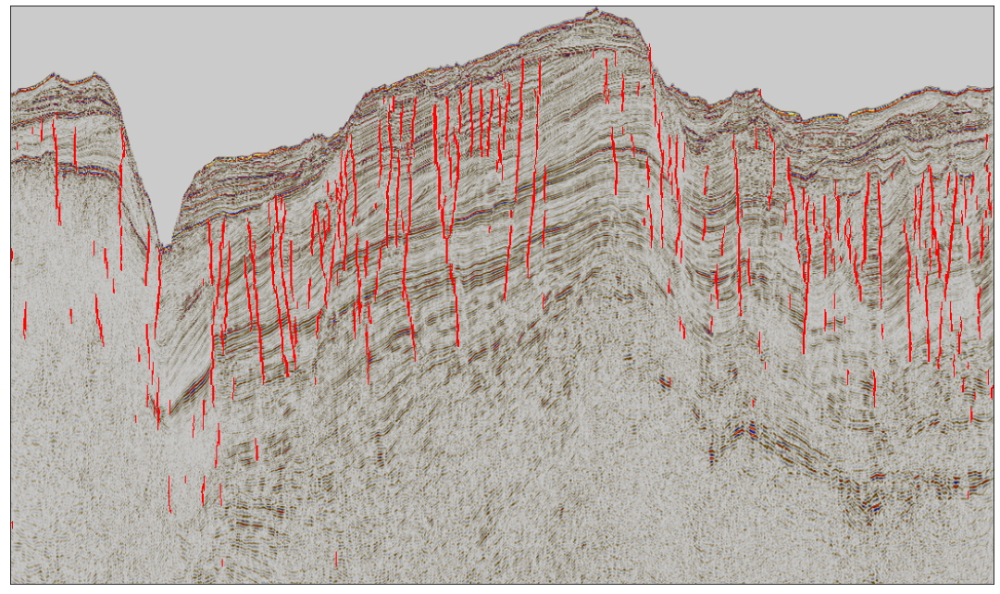

In [578]:
dt = 8
dx = 8
wsize = 8
plt.figure(figsize=(100,80))
(t_max, x_max, _) = data.shape

res_reshape = np.reshape(result_interp, (result_interp.shape[0]*result_interp.shape[1], result_interp.shape[2], result_interp.shape[3]))
result       = 1.0*(merge_no_segment(res_reshape, t_max, x_max, wsize, dt, dx)>0.05)
plot_overlay(data, result, 1)


<Figure size 7200x3600 with 0 Axes>

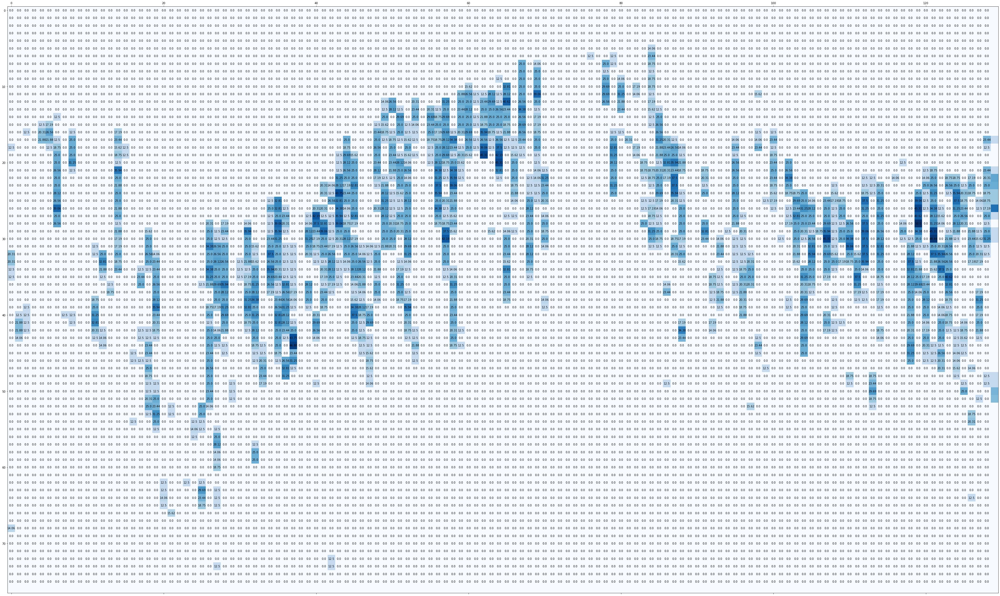

In [579]:
def counter_tile(res_data, dt, dx, seg):
    (t_max,x_max)= res_data.shape
    
    n_patch =(t_max//dt+1)*(x_max//dx+1)
    count = np.zeros((t_max//dt+1, x_max//dx+1))
    n=0
    T=[]
    N=[]
    for i, t in enumerate(range(0, t_max, dt)):
        for j, x in enumerate(range(0, x_max, dx)):
            
            if t_max - t < dt and x_max - x < dx :
                count[i,j]=np.sum(res_data[t_max-dt:t_max , x_max-dx:x_max])/dt/dx*100
            elif x_max - x < dx:
                count[i,j]=np.sum(res_data[t:t+dt, x_max-dx:x_max])/dt/dx*100
            elif t_max - t < dt:
                count[i,j]=np.sum(res_data[t_max-dt:, x:x+dx])/dt/dx*100
            else:
                count[i,j]=np.sum(res_data[t:t+dt:, x:x+dx])/dt/dx*100
            N.append(n)
            n=n+1
    return count, i, j

result_count, I, J = counter_tile(result, dt, dx, seg)

plt.figure(figsize=(100,50))
fig, ax = plt.subplots(figsize=(50,50))

min_val, max_val =np.min(result_count), np.max(result_count)

ax.matshow(result_count, cmap=plt.cm.Blues)

for i in range(I):
    for j in range(J):
        c=round(result_count[i,j], 2)
        ax.text(j, i, str(c), va='center', ha='center')

In [580]:
def patch_detect(patch):    
   
    flag = 0
    X = []
    di = 1
    dj = 5
    for i in range(di, patch.shape[0], di):
        for j in range(dj, patch.shape[1], dj):
            for ii in range(i-di, i):
                for jj in range(j-dj, j):
                    if patch[ii,jj] and not flag:
                        flag = 1
                        X.append([ii, jj])
                    if patch[ii:ii+1,jj:jj+1].any():
                        flag = 0
    return X

In [645]:
X = patch_detect(result[:,400:600].astype(np.uint8))


def detect_lines(X):
    lines = []
    
    for x1 in X:
        l = []
        l.append(x1.copy()) 
        X.pop(0)

        for i, x2 in enumerate(X):
            if np.abs(x2[0]-x1[0])<5:
                x1[0] = x2[0]
                if np.abs(x2[1]-x1[1])<4: 
                    x1[1] = x2[1]
                    l.append(x2.copy())
                    X.pop(i)
        if len(l)>20:       
            lines.append(l)
    return lines

In [646]:
angles = []
lines = detect_lines(X)
lengths = []
for l in lines:
    x1, y1 = l[0]
    x2, y2 = l[-1]

    angles.append(np.arctan2(y2-y1, x2-x1)*180/np.pi)
    lengths.append(len(l))

In [647]:
lengths

[174,
 139,
 244,
 158,
 149,
 88,
 87,
 69,
 212,
 96,
 102,
 76,
 74,
 94,
 263,
 66,
 225,
 76,
 189,
 49,
 139,
 232,
 152,
 111,
 36,
 166,
 110,
 21,
 23,
 79,
 40,
 26,
 23,
 71,
 29]

(array([0., 0., 0., 3., 2., 1., 1., 0., 1., 0., 1., 2., 4., 0., 2., 2., 1.,
        1., 1., 0., 0., 0., 2., 0., 2., 1., 0., 1., 1., 0., 1., 0., 0., 0.,
        1., 0., 1., 1., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0.]),
 array([  0.        ,   6.12244898,  12.24489796,  18.36734694,
         24.48979592,  30.6122449 ,  36.73469388,  42.85714286,
         48.97959184,  55.10204082,  61.2244898 ,  67.34693878,
         73.46938776,  79.59183673,  85.71428571,  91.83673469,
         97.95918367, 104.08163265, 110.20408163, 116.32653061,
        122.44897959, 128.57142857, 134.69387755, 140.81632653,
        146.93877551, 153.06122449, 159.18367347, 165.30612245,
        171.42857143, 177.55102041, 183.67346939, 189.79591837,
        195.91836735, 202.04081633, 208.16326531, 214.28571429,
        220.40816327, 226.53061224, 232.65306122, 238.7755102 ,
        244.89795918, 251.02040816, 257.14285714, 263.26530612,
        269.3877551 , 275.51020408, 281.63265306, 287.75510204,
        29

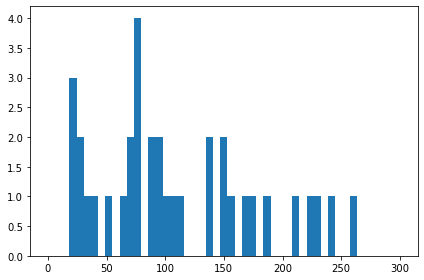

In [648]:
plt.hist(lengths, np.linspace(0,300,50))

In [649]:
angles

[-2.6541955134066213,
 -2.726310993906266,
 -3.2633313182353874,
 -3.3177811683348435,
 0.725224299059252,
 -0.725224299059252,
 -7.957525226917142,
 0.0,
 -4.685899839502703,
 -0.7588401242685469,
 -1.3078956016637844,
 0.0,
 -0.7902365024291874,
 0.0,
 -0.8615257345672586,
 0.8951737102110744,
 -3.460183228986457,
 -1.9978798564766747,
 -3.5592668212832135,
 -2.260501911141272,
 0.0,
 3.6522227803063356,
 -2.2906100426385296,
 3.674499520829663,
 0.0,
 2.5499490129601816,
 -2.0901591537106845,
 3.945186229037563,
 3.945186229037563,
 -0.6820603931726519,
 -1.6135389328811822,
 4.236394799058841,
 -3.90049374238189,
 6.519801751656986,
 6.441600099335034]

(array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1., 0., 0., 1., 2., 2., 0., 2., 2., 2., 1., 1., 0., 4., 1., 0.,
        5., 0., 0., 2., 0., 0., 0., 0., 0., 1., 0., 0., 0., 2., 2., 1., 0.,
        0., 0., 0., 0., 0., 2., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.]),
 array([-10.        ,  -9.71014493,  -9.42028986,  -9.13043478,
         -8.84057971,  -8.55072464,  -8.26086957,  -7.97101449,
         -7.68115942,  -7.39130435,  -7.10144928,  -6.8115942 ,
         -6.52173913,  -6.23188406,  -5.94202899,  -5.65217391,
         -5.36231884,  -5.07246377,  -4.7826087 ,  -4.49275362,
         -4.20289855,  -3.91304348,  -3.62318841,  -3.33333333,
         -3.04347826,  -2.75362319,  -2.46376812,  -2.17391304,
         -1.88405797,  -1.5942029 ,  -1.30434783,  -1.01449275,
         -0.72463768,  -0.43478261,  -0.14492754,   0.14492754,
          0.43478261,   0.72463768,   1.01449275,   1.30434783,
          1.5942029 ,   1.88405797,   2.17

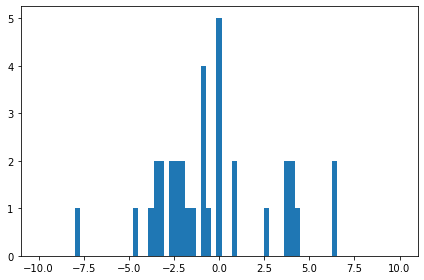

In [650]:
plt.hist(angles, np.linspace(-10,10,70))

In [651]:
lines_support = []
for l in lines:
    l_support = []

    for i in range(len(l)-1):
        x,y = l[i]
        x1, y1 = l[i+1]
        l_support.append([x,y])
        
        while x1-x>1 or y1-y>1:
            if x1-x>1:
                l_support.append([x+1,y])
                x += 1
            elif y1-y>1:
                l_support.append([x,y+1])
                y += 1

    lines_support.append(l_support)


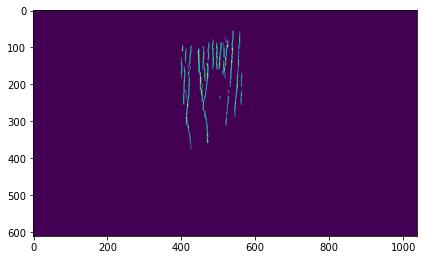

In [652]:
temp = np.zeros(result.shape)
# temp = np.pad(temp, ((0,0), (400,400)), 'constant', constant_values=0)

for ls in lines:
    for ll in ls:
        temp[ll[0]][ll[1]+400] = 1

plt.imshow(temp)    

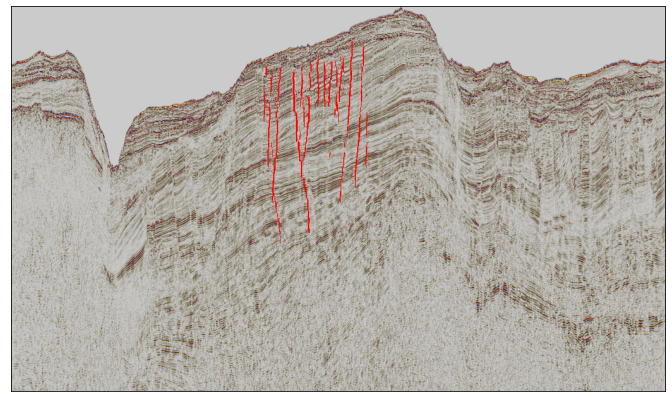

In [653]:
plt.figure(figsize=(80,50))
plot_overlay(data, temp, 1)


In [656]:
X = patch_detect(result[:,:].astype(np.uint8))


def detect_lines(X):
    lines = []
    
    for x1 in X:
        l = []
        l.append(x1.copy()) 
        X.pop(0)

        for i, x2 in enumerate(X):
            if np.abs(x2[0]-x1[0])<5:
                x1[0] = x2[0]
                if np.abs(x2[1]-x1[1])<4: 
                    x1[1] = x2[1]
                    l.append(x2.copy())
                    X.pop(i)
        if len(l)>20:       
            lines.append(l)
    return lines

In [657]:
angles = []
lines = detect_lines(X)
lengths = []
for l in lines:
    x1, y1 = l[0]
    x2, y2 = l[-1]

    angles.append(np.arctan2(y2-y1, x2-x1)*180/np.pi)
    lengths.append(len(l))

In [658]:
lengths

[222,
 133,
 104,
 174,
 53,
 40,
 139,
 243,
 159,
 153,
 50,
 31,
 88,
 105,
 94,
 96,
 33,
 83,
 70,
 67,
 212,
 71,
 165,
 261,
 142,
 225,
 121,
 193,
 67,
 232,
 36,
 112,
 179,
 39,
 24,
 146,
 130,
 113,
 132,
 107,
 166,
 32,
 22,
 91,
 107,
 90,
 212,
 126,
 195,
 25,
 58,
 151,
 89,
 65,
 45,
 65,
 25,
 138,
 163,
 25,
 101,
 103,
 28,
 185,
 122,
 137,
 108,
 187,
 121,
 37,
 98,
 253,
 56,
 62,
 216,
 40,
 189,
 125,
 88,
 95,
 184,
 72,
 51,
 79,
 91,
 137,
 173,
 92,
 31,
 101,
 96,
 105,
 30,
 109,
 223,
 46,
 103,
 181,
 63,
 86,
 246,
 28,
 45,
 120,
 215,
 167,
 77,
 104,
 36,
 128,
 25,
 65,
 33,
 62,
 106,
 75,
 25,
 21,
 70,
 63,
 102,
 77,
 74,
 223,
 35,
 47,
 242,
 185,
 68,
 145,
 33,
 48,
 55,
 164,
 36,
 139,
 45,
 113,
 88,
 110,
 57,
 88,
 96,
 140,
 139,
 72,
 34,
 74,
 27,
 86,
 33,
 120,
 49,
 38,
 23,
 105,
 132,
 39,
 81,
 30,
 61,
 48,
 30,
 37,
 25,
 46,
 53,
 26,
 21,
 42,
 23,
 26,
 38,
 32,
 21]

(array([ 0.,  0.,  0.,  4., 14., 12., 10.,  6.,  8.,  5.,  4.,  8.,  7.,
         4.,  2., 10.,  6.,  4., 11.,  5.,  0.,  6.,  3.,  5.,  6.,  2.,
         2.,  1.,  3.,  2.,  2.,  2.,  4.,  2.,  1.,  0.,  0.,  4.,  1.,
         3.,  1.,  0.,  2.,  1.,  1.,  1.,  0.,  0.,  0.]),
 array([  0.        ,   5.71428571,  11.42857143,  17.14285714,
         22.85714286,  28.57142857,  34.28571429,  40.        ,
         45.71428571,  51.42857143,  57.14285714,  62.85714286,
         68.57142857,  74.28571429,  80.        ,  85.71428571,
         91.42857143,  97.14285714, 102.85714286, 108.57142857,
        114.28571429, 120.        , 125.71428571, 131.42857143,
        137.14285714, 142.85714286, 148.57142857, 154.28571429,
        160.        , 165.71428571, 171.42857143, 177.14285714,
        182.85714286, 188.57142857, 194.28571429, 200.        ,
        205.71428571, 211.42857143, 217.14285714, 222.85714286,
        228.57142857, 234.28571429, 240.        , 245.71428571,
        251.42857

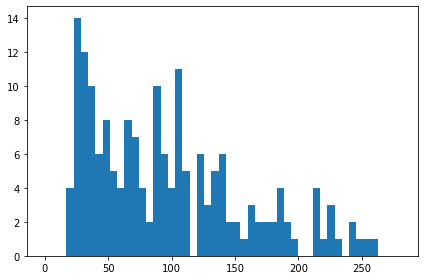

In [661]:
plt.hist(lengths, np.linspace(0,280,50))

In [662]:
angles

[3.725628193348981,
 3.6822740623052757,
 0.0,
 -3.0327026161769757,
 -1.2188752351312977,
 2.489552921999156,
 -2.7638573709125587,
 -3.0664855011258934,
 -3.5763343749973515,
 0.7221774615448104,
 -0.9710219310791666,
 -1.9091524329963763,
 -8.042894233505312,
 -1.2960634980171208,
 0.8069294551023743,
 -1.517414125012136,
 -0.20536033749487598,
 -0.8184554616886145,
 0.8303154862580109,
 0.9240453527727062,
 -4.7901307223632275,
 -1.227578832134544,
 -2.8803775528476065,
 -0.8713515176783685,
 -0.38712775415095124,
 -3.224522606519908,
 -2.6025622024998065,
 -3.593566187865195,
 -1.6135389328811822,
 4.05673786129488,
 0.0,
 3.6411852579013417,
 2.489552921999156,
 1.735704588928389,
 -5.194428907734806,
 -1.6135389328811822,
 0.9963478965049255,
 4.159642293712642,
 -1.5154079000221272,
 -2.2369790634377016,
 0.0,
 0.99203556598862,
 0.36493633573064554,
 0.0,
 -0.40348473505875015,
 -1.3639275316029187,
 2.098905933203546,
 1.026696180057873,
 -6.5819446551780105,
 7.7651660184253

(array([ 0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  2.,  0.,
         0.,  0.,  1.,  1.,  1.,  1.,  1.,  4.,  4.,  3.,  4.,  4.,  2.,
         4.,  4.,  8.,  9.,  4.,  8., 10.,  4., 13.,  2.,  3.,  6.,  7.,
         3., 10.,  3.,  7.,  9.,  1.,  0.,  0.,  7.,  4.,  2.,  3.,  1.,
         2.,  2.,  3.,  1.,  2.,  0.,  0.,  1.,  1.,  1.,  0.,  1.,  0.,
         0.,  0.,  0.,  0.]),
 array([-10.        ,  -9.71014493,  -9.42028986,  -9.13043478,
         -8.84057971,  -8.55072464,  -8.26086957,  -7.97101449,
         -7.68115942,  -7.39130435,  -7.10144928,  -6.8115942 ,
         -6.52173913,  -6.23188406,  -5.94202899,  -5.65217391,
         -5.36231884,  -5.07246377,  -4.7826087 ,  -4.49275362,
         -4.20289855,  -3.91304348,  -3.62318841,  -3.33333333,
         -3.04347826,  -2.75362319,  -2.46376812,  -2.17391304,
         -1.88405797,  -1.5942029 ,  -1.30434783,  -1.01449275,
         -0.72463768,  -0.43478261,  -0.14492754,   0.14492754,
          0.43478261,   0.724

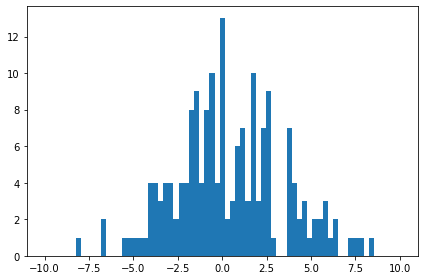

In [663]:
plt.hist(angles, np.linspace(-10,10,70))